### Inicializing Spark

In [1]:
import os
os.environ ['SPARK_HOME'] = '/home/otniel/spark-3.5.0-bin-hadoop3' # My directory on my computer

In [2]:
import findspark
findspark.init()

In [3]:
from pyspark.sql import SparkSession

In [5]:
spark = SparkSession\
    .builder\
    .master('local[*]')\
    .appName('Spark Recomendation System Music')\
    .getOrCreate()

In [5]:
spark

#### Spark Debug

In [6]:
spark.sparkContext.setLogLevel('ERROR')

### Imports:

In [7]:
from pyspark.sql import functions as f
from pyspark.ml.feature import VectorAssembler, StandardScaler, PCA
from pyspark.ml import Pipeline
from pyspark.ml.clustering import KMeans
from pyspark.ml.functions import vector_to_array
from pyspark.sql.types import FloatType
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import euclidean
import spotipy
from spotipy.oauth2 import SpotifyOAuth, SpotifyClientCredentials
from skimage import io

### API Database

* Acousticness/Acoustics: numerical variable; confidence measure from 0.0 to 1.0 if the track is acoustic. 1.0 represents high confidence that the track is acoustic.

* Danceability: numerical variable; danceability describes how suitable a track is for dancing based on a combination of musical elements, including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is the least and 1.0 is the most danceable.

* Duration_ms: numeric variable; the length of the track in milliseconds.

* Duration_min: numeric variable; the length of the track in minutes.

* Energy/Energy: numerical variable; Energy is a measurement from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. Typically, energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low on the scale. Perceptual characteristics that contribute to this attribute include dynamic range, perceived loudness, timbre, onset rate, and overall entropy.

* Explicit/Explicit: categorical variable; whether or not the track has explicit lyrics (true = yes (1); false = no (0), no OR unknown).

* Id: The Spotify ID for the track.

* Instrumentalness/Instrumentality: numerical variable; predicts whether a track contains no vocals. The sounds “Ooh” and “aah” are treated as instrumentals in this context. Rap or spoken word tracks are clearly “vocal.” The closer the instrumentality value is to 1.0, the more likely the track is to contain no vocal content. Values above 0.5 are intended to represent instrumental tracks, but confidence is greater as the value approaches 1.0.

* Key: numeric variable; the estimated general key of the track. Integers are mapped to pitches using standard Pitch Class notation. For example, 0 = C, 1 = C#/Db, 2 = D, and so on. If no key was detected, the value is -1.

* Liveness/Ao vivo: numeric variable; detects the presence of an audience in the recording. Higher liveness values represent a greater likelihood that the track was performed live. A value above 0.8 gives a strong probability that the track is active.

* Loudness/Volume in dB: numeric variable; overall volume of a track in decibels (dB). Volume values are averaged across the entire track and are useful for comparing the relative loudness of tracks. Loudness is the quality of a sound in relation to its amplitude (“pitch”), measuring the relationship between the peaks and troughs of a sound wave. Typical values range between -60 and 0 db.

* Mode/Modo: numeric variable; the mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. Major is represented by 1 and minor is 0.

* Popularity: numerical variable; The popularity of a track is a value between 0 and 100, with 100 being the most popular. Popularity is calculated algorithmically and is largely based on the total number of plays the track has had and how recent those plays are.

* Speechiness/Speech: numeric variable; detects the presence of spoken words in a track. The more exclusively spoken the recording (e.g. talk show, audiobook, poetry), the closer the attribute value will be to 1.0. Values above 0.66 describe tracks that are likely to be made entirely of spoken words. Values between 0.33 and 0.66 describe tracks that can contain music and speech, either in sections or in layers, including cases such as rap-style music. Values below 0.33 likely represent music and other non-speech tracks.

* Time: numeric variable; Overall estimated tempo of a track in beats per minute (BPM). In musical terminology, tempo is the speed or rhythm of a given piece and derives directly from the average beat duration.

* Valence/Valencia: numeric variable; measure from 0.0 to 1.0 describing the musical positivity conveyed by a track. Tracks with high valence sound more positive (e.g., happy, joyful, euphoric), while tracks with low valence sound more negative (e.g., sad, depressed, angry).

* Year/Year: year in which the song was released.

### Loading Databases

In [8]:
database_music = spark.read.csv('dados_musicas.csv', sep=';', header=True, inferSchema=True)

In [9]:
database_year = spark.read.csv('dados_musicas_ano.csv', sep=',', header=True, inferSchema=True)

In [10]:
database_genres = spark.read.csv('dados_musicas_genero.csv', sep=',', header=True, inferSchema=True)

### Saving/Convert Databases Parquet

#### Database music

In [11]:
database_music.write.parquet(
    path='database_music_parquet',
    mode='overwrite'
)

In [12]:
database_music = spark.read.parquet('database_music_parquet')

#### Database year

In [13]:
database_year.write.parquet(
    path='database_year_parquet',
    mode='overwrite'
)

In [14]:
database_year = spark.read.parquet('database_year_parquet')

#### Database genres

In [15]:
database_genres.write.parquet(
    path='database_genres_parquet',
    mode='overwrite'
)

In [16]:
database_genres = spark.read.parquet('database_genres_parquet')

### Analizing the Database Music

In [17]:
database_music.limit(10).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,3,0.1060,-4.262,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness
6,0.722,2000,0.061600,Nelly,0.850,291782,0.700,1,3Gf5nttwcX9aaSQXRWidEZ,0.000002,7,0.2440,-6.490,1,Ride Wit Me,74,0.0478,101.875,Nelly - Ride Wit Me
7,0.507,2000,0.037100,Eminem,0.780,404107,0.768,1,3UmaczJpikHgJFyBTAJVoz,0.000002,6,0.5180,-4.325,0,Stan,78,0.2380,80.063,Eminem - Stan
8,0.861,2000,0.031000,*NSYNC,0.610,200400,0.926,0,62bOmKYxYg7dhrC6gH9vFn,0.001200,8,0.0821,-4.843,0,Bye Bye Bye,71,0.0479,172.638,*NSYNC - Bye Bye Bye
9,0.894,2000,0.300000,Britney Spears,0.751,211160,0.834,0,6naxalmIoLFWR0siv8dnQQ,0.000018,1,0.3550,-5.444,0,Oops!...I Did It Again,78,0.0437,95.053,Britney Spears - Oops!...I Did It Again


In [18]:
database_music.printSchema()

root
 |-- valence: double (nullable = true)
 |-- year: integer (nullable = true)
 |-- acousticness: double (nullable = true)
 |-- artists: string (nullable = true)
 |-- danceability: double (nullable = true)
 |-- duration_ms: integer (nullable = true)
 |-- energy: double (nullable = true)
 |-- explicit: integer (nullable = true)
 |-- id: string (nullable = true)
 |-- instrumentalness: double (nullable = true)
 |-- key: integer (nullable = true)
 |-- liveness: double (nullable = true)
 |-- loudness: double (nullable = true)
 |-- mode: integer (nullable = true)
 |-- name: string (nullable = true)
 |-- popularity: integer (nullable = true)
 |-- speechiness: double (nullable = true)
 |-- tempo: double (nullable = true)
 |-- artists_song: string (nullable = true)



#### Record or line numbers

In [19]:
database_music.count()

20311

#### Columns numbers

In [20]:
len(database_music.columns)

19

#### Checking if there is null data

In [21]:
database_music\
    .select([f.count(f.when(f.isnull(c), 1)).alias(c) for c in database_music.columns])\
    .toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##### The database does not have null data

#### Checking the years of song releases

In [22]:
database_music\
    .groupBy('year')\
    .count()\
    .orderBy('year')\
    .show(n=21)

+----+-----+
|year|count|
+----+-----+
|2000|  867|
|2001|  932|
|2002| 1003|
|2003|  908|
|2004|  943|
|2005|  951|
|2006|  958|
|2007|  944|
|2008|  900|
|2009|  972|
|2010| 1059|
|2011|  979|
|2012|  994|
|2013|  986|
|2014|  927|
|2015| 1021|
|2016|  855|
|2017|  969|
|2018| 1080|
|2019|  913|
|2020| 1150|
+----+-----+



In [23]:
print(
    sorted(database_music\
           .select('year')\
           .distinct()\
           .collect()
          )
)

[Row(year=2000), Row(year=2001), Row(year=2002), Row(year=2003), Row(year=2004), Row(year=2005), Row(year=2006), Row(year=2007), Row(year=2008), Row(year=2009), Row(year=2010), Row(year=2011), Row(year=2012), Row(year=2013), Row(year=2014), Row(year=2015), Row(year=2016), Row(year=2017), Row(year=2018), Row(year=2019), Row(year=2020)]


### Analizing the Database Year

In [24]:
database_year.limit(10).toPandas()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.205710,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.240720,-19.275282,0.116655,100.884521,0.535549,0.140845,10
2,1,1923,0.957247,0.577341,177942.362162,0.262406,0.371733,0.227462,-14.129211,0.093949,114.010730,0.625492,5.389189,0
3,1,1924,0.940200,0.549894,191046.707627,0.344347,0.581701,0.235219,-14.231343,0.092089,120.689572,0.663725,0.661017,10
4,1,1925,0.962607,0.573863,184986.924460,0.278594,0.418297,0.237668,-14.146414,0.111918,115.521921,0.621929,2.604317,5
5,1,1926,0.660817,0.599880,156881.657475,0.211467,0.333093,0.232370,-18.492538,0.483704,109.648033,0.436910,1.422351,9
6,1,1927,0.936179,0.648268,184993.598374,0.264321,0.391328,0.168450,-14.422374,0.113610,114.846524,0.659700,0.801626,7
7,1,1928,0.938617,0.534288,214827.906423,0.207948,0.494835,0.175289,-17.191983,0.159911,106.772262,0.495713,1.525773,1
8,1,1929,0.601427,0.647670,168999.412815,0.241801,0.215204,0.236000,-16.530376,0.490001,110.948357,0.636530,0.340336,7
9,1,1930,0.936715,0.518176,195150.285343,0.333524,0.352206,0.221311,-12.869221,0.119910,109.871194,0.616238,0.926715,2


#### Adjusting the data according to the years present in the previous database(database_music)

In [25]:
database_year = database_year\
    .filter('year >= 2000')

In [26]:
database_year.limit(10).toPandas()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049,7
1,1,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125,7
2,1,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500,7
3,1,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407,7
4,1,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143,7
5,1,2005,0.255764,0.572281,237229.588205,0.653209,0.090194,0.190082,-7.466159,0.093334,121.617967,0.532531,50.953333,0
6,1,2006,0.279986,0.568230,234042.914359,0.650326,0.077701,0.188289,-7.265501,0.085847,121.798615,0.520028,51.313846,7
7,1,2007,0.254081,0.563414,241049.962564,0.668305,0.072957,0.196127,-7.044536,0.084347,124.087516,0.516794,51.075897,7
8,1,2008,0.249192,0.579193,240107.315601,0.671461,0.063662,0.198431,-6.843804,0.077356,123.509934,0.527542,50.630179,0
9,1,2009,0.261929,0.564190,238140.013265,0.670749,0.075872,0.205252,-7.046015,0.085458,123.463808,0.507170,51.440816,0


#### Record or line numbers

In [27]:
database_year.count()

21

#### Columns numbers

In [28]:
len(database_year.columns)

14

#### Checking if there is null data

In [29]:
database_year\
    .select([f.count(f.when(f.isnull(c), 1)).alias(c) for c in database_year.columns])\
    .toPandas()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##### The database does not have null data

### Checking the variation in loudness according to the years

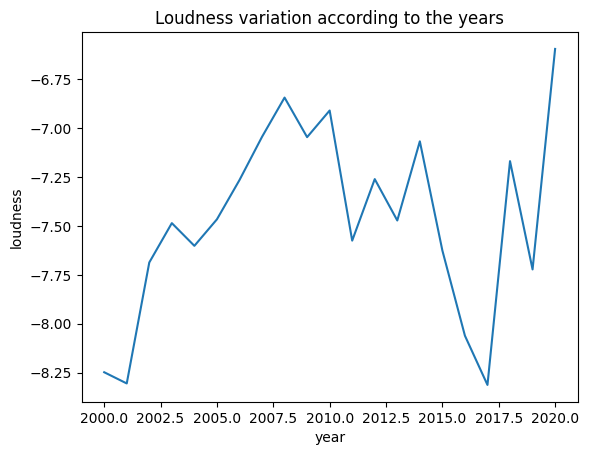

In [30]:
sns.lineplot(data=database_year.toPandas(), x='year', y='loudness', markers=True )
plt.title('Loudness variation according to the years')
plt.show()

### Checking the variation according to the years

In [31]:
temp_database = database_year.drop('mode').toPandas()

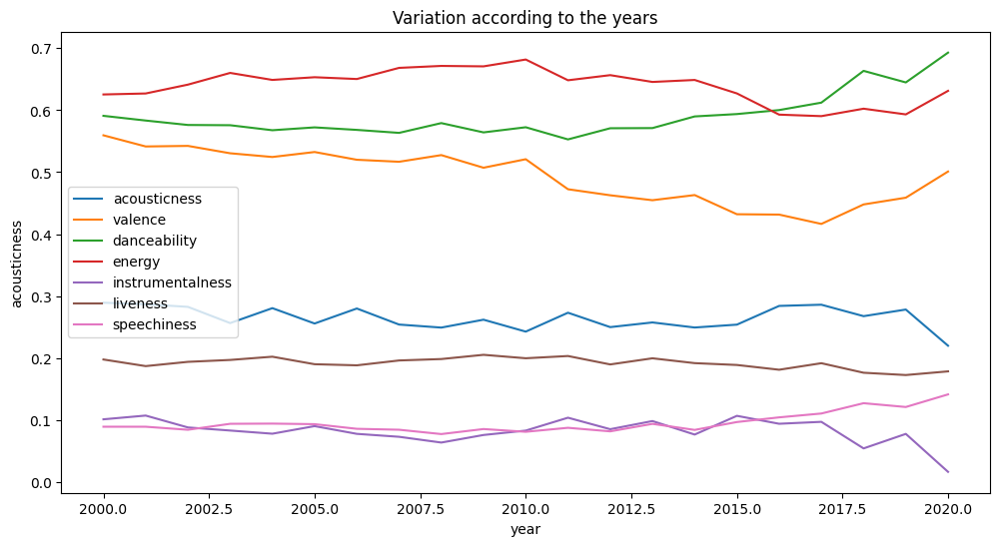

In [32]:
plt.figure(figsize=(12,6))
sns.lineplot(data=temp_database, x='year', y='acousticness', markers=True, label='acousticness')
sns.lineplot(data=temp_database, x='year', y='valence', markers=True, label='valence')
sns.lineplot(data=temp_database, x='year', y='danceability', markers=True, label='danceability')
sns.lineplot(data=temp_database, x='year', y='energy', markers=True, label='energy')
sns.lineplot(data=temp_database, x='year', y='instrumentalness', markers=True, label='instrumentalness')
sns.lineplot(data=temp_database, x='year', y='liveness', markers=True, label='liveness')
sns.lineplot(data=temp_database, x='year', y='speechiness', markers=True, label='speechiness')
plt.title('Variation according to the years')
plt.show()

##### According to the graph above, it is understood that there is no significant variation in relation to the characteristics of the songs according to the years

### Checking Correlation

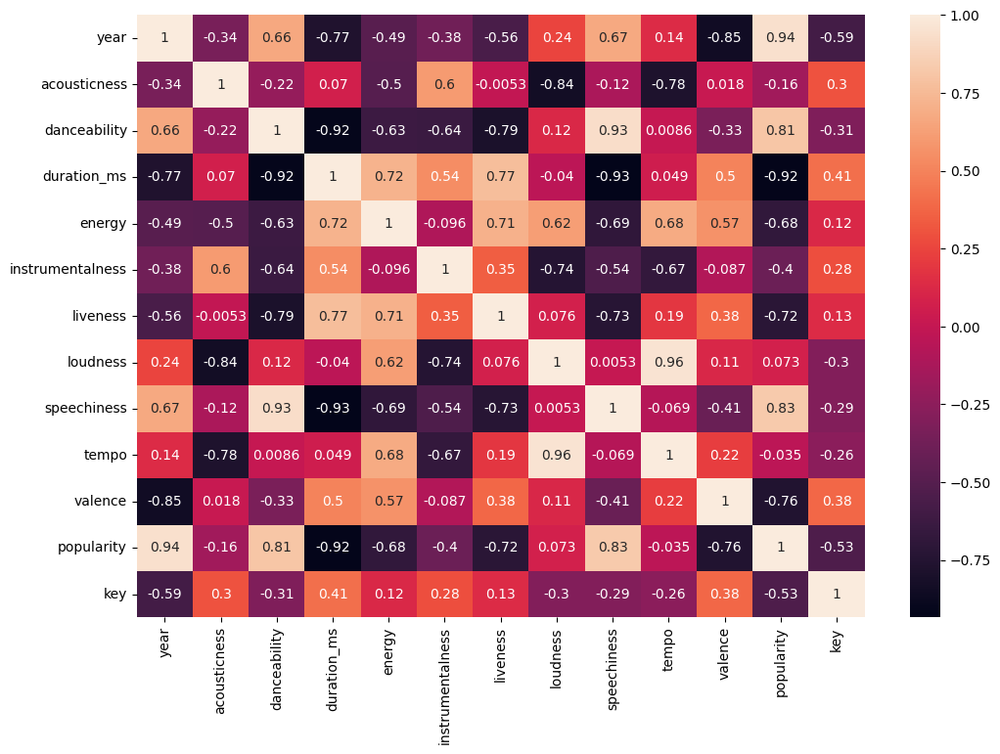

In [33]:
plt.figure(figsize=(12,8))
sns.heatmap(temp_database.corr(), annot = True)
plt.show();

### Analizing the Database Genres

In [34]:
database_genres.limit(10).toPandas()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7
5,1,abstract,0.459210,0.516167,3.431965e+05,0.442417,0.849667,0.118067,-15.472083,0.046517,127.885750,0.307325,43.500000,1
6,1,abstract beats,0.342147,0.623000,2.299362e+05,0.527800,0.333603,0.099653,-7.918000,0.116373,112.413800,0.493507,58.933333,10
7,1,abstract hip hop,0.243854,0.694571,2.318492e+05,0.646235,0.024231,0.168543,-7.349328,0.214258,108.244987,0.571391,39.790702,2
8,0,accordeon,0.323000,0.588000,1.640000e+05,0.392000,0.441000,0.079400,-14.899000,0.072700,109.131000,0.709000,39.000000,2
9,1,accordion,0.446125,0.624812,1.670616e+05,0.373437,0.193738,0.160300,-14.487063,0.078538,112.872438,0.658688,21.937500,2


#### Record or line numbers

In [35]:
database_genres.count()

2973

#### Columns numbers

In [36]:
len(database_genres.columns)

14

#### Checking if there is null data

In [37]:
database_genres\
    .select([f.count(f.when(f.isnull(c), 1)).alias(c) for c in database_genres.columns])\
    .toPandas()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##### The database does not have null data

### Checking Correlation

In [38]:
genres_temp = database_genres.drop('genres', 'mode').toPandas()

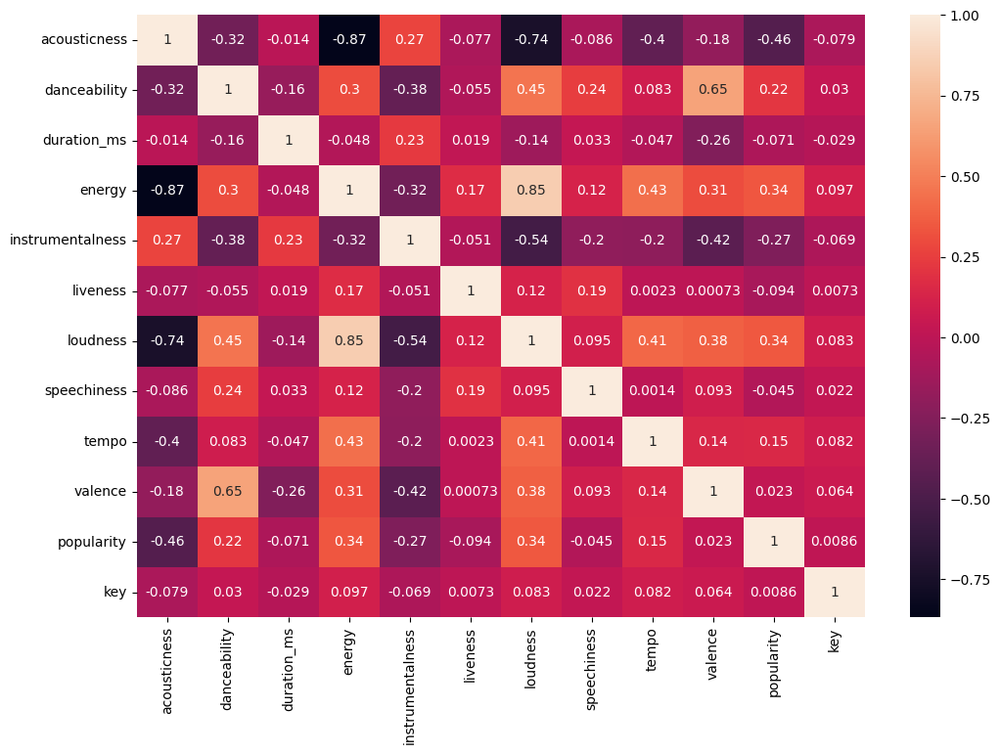

In [39]:
plt.figure(figsize=(12,8))
sns.heatmap(genres_temp.corr(), annot=True)
plt.show();

### Normalizing the data

In [40]:
database_genres.columns

['mode',
 'genres',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence',
 'popularity',
 'key']

In [41]:
X = database_genres.columns
X.remove('genres')

In [42]:
X

['mode',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'loudness',
 'speechiness',
 'tempo',
 'valence',
 'popularity',
 'key']

In [43]:
genres_df_vec = VectorAssembler(inputCols=X, outputCol='features').transform(database_genres).select(['features', 'genres'])

In [44]:
genres_df_vec.limit(10).toPandas()

,features,genres
0,"[1.0, 0.9793333333333332, 0.16288333333333335,...",21st century classical
1,"[1.0, 0.49478, 0.2993333333333333, 1048887.333...",432hz
2,"[1.0, 0.762, 0.7120000000000001, 115177.0, 0.8...",8-bit
3,"[1.0, 0.6514170195595453, 0.5290925603549332, ...",[]
4,"[1.0, 0.676557304985755, 0.5389612464387464, 1...",a cappella
5,"[1.0, 0.45921, 0.5161666666666667, 343196.5, 0...",abstract
6,"[1.0, 0.3421466666666667, 0.623, 229936.2, 0.5...",abstract beats
7,"[1.0, 0.2438540633608816, 0.6945709366391184, ...",abstract hip hop
8,"[0.0, 0.32299999999999995, 0.588, 164000.0, 0....",accordeon
9,"[1.0, 0.446125, 0.6248125, 167061.5625, 0.3734...",accordion


In [45]:
genres_df_vec.show(n=1, vertical=True, truncate=False)

-RECORD 0---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
 features | [1.0,0.9793333333333332,0.16288333333333335,160297.66666666663,0.07131666666666665,0.60683367,0.3616,-31.514333333333337,0.04056666666666667,75.3365,0.10378333333333334,27.83333333333333,6.0] 
 genres   | 21st century classical                                                                                                                                                                          
only showing top 1 row



In [46]:
scaler = StandardScaler(inputCol='features', outputCol='scaled_features')

In [47]:
model_scaler = scaler.fit(genres_df_vec)

In [48]:
database_genres_scaled = model_scaler.transform(genres_df_vec)

In [49]:
database_genres_scaled.show(n=10)

+--------------------+--------------------+--------------------+
|            features|              genres|     scaled_features|
+--------------------+--------------------+--------------------+
|[1.0,0.9793333333...|21st century clas...|[2.68174831000279...|
|[1.0,0.49478,0.29...|               432hz|[2.68174831000279...|
|[1.0,0.762,0.7120...|               8-bit|[2.68174831000279...|
|[1.0,0.6514170195...|                  []|[2.68174831000279...|
|[1.0,0.6765573049...|          a cappella|[2.68174831000279...|
|[1.0,0.45921,0.51...|            abstract|[2.68174831000279...|
|[1.0,0.3421466666...|      abstract beats|[2.68174831000279...|
|[1.0,0.2438540633...|    abstract hip hop|[2.68174831000279...|
|[0.0,0.3229999999...|           accordeon|[0.0,1.0101313736...|
|[1.0,0.446125,0.6...|           accordion|[2.68174831000279...|
+--------------------+--------------------+--------------------+
only showing top 10 rows



### Applying PCA

In [50]:
pca_genres = PCA(inputCol='scaled_features', outputCol='pca_features', k=2)

In [51]:
model_pca_genres = pca_genres.fit(database_genres_scaled)

In [52]:
database_genres_pca = model_pca_genres.transform(database_genres_scaled)

In [53]:
database_genres_pca.show()

+--------------------+--------------------+--------------------+--------------------+
|            features|              genres|     scaled_features|        pca_features|
+--------------------+--------------------+--------------------+--------------------+
|[1.0,0.9793333333...|21st century clas...|[2.68174831000279...|[-2.5070953668885...|
|[1.0,0.49478,0.29...|               432hz|[2.68174831000279...|[0.59696790566334...|
|[1.0,0.762,0.7120...|               8-bit|[2.68174831000279...|[4.15846027622356...|
|[1.0,0.6514170195...|                  []|[2.68174831000279...|[2.38734487851221...|
|[1.0,0.6765573049...|          a cappella|[2.68174831000279...|[2.65012183716790...|
|[1.0,0.45921,0.51...|            abstract|[2.68174831000279...|[1.49650912033676...|
|[1.0,0.3421466666...|      abstract beats|[2.68174831000279...|[3.92352077215732...|
|[1.0,0.2438540633...|    abstract hip hop|[2.68174831000279...|[4.61101110983111...|
|[0.0,0.3229999999...|           accordeon|[0.0,1.0101

In [54]:
database_genres_pca\
    .select('pca_features')\
    .show(n=10, truncate=False)

+-----------------------------------------+
|pca_features                             |
+-----------------------------------------+
|[-2.507095366888566,-0.43816913737698426]|
|[0.5969679056633481,-4.9816120527513545] |
|[4.158460276223561,0.8366525081079923]   |
|[2.3873448785122164,0.4877989015663364]  |
|[2.6501218371679087,0.5756819768820428]  |
|[1.4965091203367626,-1.8644183183717817] |
|[3.9235207721573238,-0.2851835002352867] |
|[4.6110111098311135,0.6783790472312343]  |
|[2.8376900630842297,0.5712993716580531]  |
|[2.7066901398927827,1.2593788079708268]  |
+-----------------------------------------+
only showing top 10 rows



### Creating Pipeline

In [55]:
pipeline_genres = Pipeline(stages=[
    VectorAssembler(inputCols=X, outputCol='features'),
    StandardScaler(inputCol='features', outputCol='scaled_features'),
    PCA(inputCol='scaled_features', outputCol='pca_features', k=2)
])

In [56]:
modelpipeline_genres = pipeline_genres.fit(database_genres)

In [57]:
df_genres_pca = modelpipeline_genres.transform(database_genres)

In [58]:
df_genres_pca.limit(10).toPandas()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,features,scaled_features,pca_features
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6,"[1.0, 0.9793333333333332, 0.16288333333333335,...","[2.6817483100027903, 3.06270998538775, 1.08107...","[-2.507095366888566, -0.43816913737698426]"
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5,"[1.0, 0.49478, 0.2993333333333333, 1048887.333...","[2.6817483100027903, 1.5473461333255456, 1.986...","[0.5969679056633481, -4.9816120527513545]"
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7,"[1.0, 0.762, 0.7120000000000001, 115177.0, 0.8...","[2.6817483100027903, 2.3830343861798493, 4.725...","[4.158460276223561, 0.8366525081079923]"
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7,"[1.0, 0.6514170195595453, 0.5290925603549332, ...","[2.6817483100027903, 2.0372036185737374, 3.511...","[2.3873448785122164, 0.4877989015663364]"
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7,"[1.0, 0.676557304985755, 0.5389612464387464, 1...","[2.6817483100027903, 2.1158258818926794, 3.577...","[2.6501218371679087, 0.5756819768820428]"
5,1,abstract,0.459210,0.516167,3.431965e+05,0.442417,0.849667,0.118067,-15.472083,0.046517,127.885750,0.307325,43.500000,1,"[1.0, 0.45921, 0.5161666666666667, 343196.5, 0...","[2.6817483100027903, 1.4361065885533446, 3.425...","[1.4965091203367626, -1.8644183183717817]"
6,1,abstract beats,0.342147,0.623000,2.299362e+05,0.527800,0.333603,0.099653,-7.918000,0.116373,112.413800,0.493507,58.933333,10,"[1.0, 0.3421466666666667, 0.623, 229936.2, 0.5...","[2.6817483100027903, 1.0700095430229417, 4.134...","[3.9235207721573238, -0.2851835002352867]"
7,1,abstract hip hop,0.243854,0.694571,2.318492e+05,0.646235,0.024231,0.168543,-7.349328,0.214258,108.244987,0.571391,39.790702,2,"[1.0, 0.2438540633608816, 0.6945709366391184, ...","[2.6817483100027903, 0.762614984512678, 4.6099...","[4.6110111098311135, 0.6783790472312343]"
8,0,accordeon,0.323000,0.588000,1.640000e+05,0.392000,0.441000,0.079400,-14.899000,0.072700,109.131000,0.709000,39.000000,2,"[0.0, 0.32299999999999995, 0.588, 164000.0, 0....","[0.0, 1.010131373669411, 3.902627701858959, 1....","[2.8376900630842297, 0.5712993716580531]"
9,1,accordion,0.446125,0.624812,1.670616e+05,0.373437,0.193738,0.160300,-14.487063,0.078538,112.872438,0.658688,21.937500,2,"[1.0, 0.446125, 0.6248125, 167061.5625, 0.3734...","[2.6817483100027903, 1.395185322223734, 4.1469...","[2.7066901398927827, 1.2593788079708268]"


In [59]:
df_genres_pca\
    .select('pca_features')\
    .show(n=10, truncate=False)

+-----------------------------------------+
|pca_features                             |
+-----------------------------------------+
|[-2.507095366888566,-0.43816913737698426]|
|[0.5969679056633481,-4.9816120527513545] |
|[4.158460276223561,0.8366525081079923]   |
|[2.3873448785122164,0.4877989015663364]  |
|[2.6501218371679087,0.5756819768820428]  |
|[1.4965091203367626,-1.8644183183717817] |
|[3.9235207721573238,-0.2851835002352867] |
|[4.6110111098311135,0.6783790472312343]  |
|[2.8376900630842297,0.5712993716580531]  |
|[2.7066901398927827,1.2593788079708268]  |
+-----------------------------------------+
only showing top 10 rows



### KMeans

#### Defining seed

In [60]:
SEED = 33

In [61]:
kmeans_genres = KMeans(featuresCol='pca_features', predictionCol='cluster_pca', k=5, seed=SEED)

In [62]:
modelkm_genres = kmeans_genres.fit(df_genres_pca)

In [63]:
predictionkm_genres  = modelkm_genres.transform(df_genres_pca)

In [64]:
predictionkm_genres.limit(10).toPandas()

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,features,scaled_features,pca_features,cluster_pca
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6,"[1.0, 0.9793333333333332, 0.16288333333333335,...","[2.6817483100027903, 3.06270998538775, 1.08107...","[-2.507095366888566, -0.43816913737698426]",4
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5,"[1.0, 0.49478, 0.2993333333333333, 1048887.333...","[2.6817483100027903, 1.5473461333255456, 1.986...","[0.5969679056633481, -4.9816120527513545]",4
2,1,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7,"[1.0, 0.762, 0.7120000000000001, 115177.0, 0.8...","[2.6817483100027903, 2.3830343861798493, 4.725...","[4.158460276223561, 0.8366525081079923]",0
3,1,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7,"[1.0, 0.6514170195595453, 0.5290925603549332, ...","[2.6817483100027903, 2.0372036185737374, 3.511...","[2.3873448785122164, 0.4877989015663364]",0
4,1,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7,"[1.0, 0.676557304985755, 0.5389612464387464, 1...","[2.6817483100027903, 2.1158258818926794, 3.577...","[2.6501218371679087, 0.5756819768820428]",0
5,1,abstract,0.459210,0.516167,3.431965e+05,0.442417,0.849667,0.118067,-15.472083,0.046517,127.885750,0.307325,43.500000,1,"[1.0, 0.45921, 0.5161666666666667, 343196.5, 0...","[2.6817483100027903, 1.4361065885533446, 3.425...","[1.4965091203367626, -1.8644183183717817]",1
6,1,abstract beats,0.342147,0.623000,2.299362e+05,0.527800,0.333603,0.099653,-7.918000,0.116373,112.413800,0.493507,58.933333,10,"[1.0, 0.3421466666666667, 0.623, 229936.2, 0.5...","[2.6817483100027903, 1.0700095430229417, 4.134...","[3.9235207721573238, -0.2851835002352867]",0
7,1,abstract hip hop,0.243854,0.694571,2.318492e+05,0.646235,0.024231,0.168543,-7.349328,0.214258,108.244987,0.571391,39.790702,2,"[1.0, 0.2438540633608816, 0.6945709366391184, ...","[2.6817483100027903, 0.762614984512678, 4.6099...","[4.6110111098311135, 0.6783790472312343]",2
8,0,accordeon,0.323000,0.588000,1.640000e+05,0.392000,0.441000,0.079400,-14.899000,0.072700,109.131000,0.709000,39.000000,2,"[0.0, 0.32299999999999995, 0.588, 164000.0, 0....","[0.0, 1.010131373669411, 3.902627701858959, 1....","[2.8376900630842297, 0.5712993716580531]",0
9,1,accordion,0.446125,0.624812,1.670616e+05,0.373437,0.193738,0.160300,-14.487063,0.078538,112.872438,0.658688,21.937500,2,"[1.0, 0.446125, 0.6248125, 167061.5625, 0.3734...","[2.6817483100027903, 1.395185322223734, 4.1469...","[2.7066901398927827, 1.2593788079708268]",0


In [65]:
predictionkm_genres\
    .select(
        'genres',
        'pca_features',
        'cluster_pca'
    )\
    .show(n=20, truncate=False)

+----------------------+-----------------------------------------+-----------+
|genres                |pca_features                             |cluster_pca|
+----------------------+-----------------------------------------+-----------+
|21st century classical|[-2.507095366888566,-0.43816913737698426]|4          |
|432hz                 |[0.5969679056633481,-4.9816120527513545] |4          |
|8-bit                 |[4.158460276223561,0.8366525081079923]   |0          |
|[]                    |[2.3873448785122164,0.4877989015663364]  |0          |
|a cappella            |[2.6501218371679087,0.5756819768820428]  |0          |
|abstract              |[1.4965091203367626,-1.8644183183717817] |1          |
|abstract beats        |[3.9235207721573238,-0.2851835002352867] |0          |
|abstract hip hop      |[4.6110111098311135,0.6783790472312343]  |2          |
|accordeon             |[2.8376900630842297,0.5712993716580531]  |0          |
|accordion             |[2.7066901398927827,1.259378

### Plotting The Clustering

In [66]:
features_Xy = predictionkm_genres\
    .withColumn('X', vector_to_array('pca_features')[0])\
    .withColumn('y', vector_to_array('pca_features')[1])\
    .select(['X', 'y', 'cluster_pca', 'genres'])

In [67]:
features_Xy.show(n=10)

+------------------+--------------------+-----------+--------------------+
|                 X|                   y|cluster_pca|              genres|
+------------------+--------------------+-----------+--------------------+
|-2.507095366888566|-0.43816913737698426|          4|21st century clas...|
|0.5969679056633481| -4.9816120527513545|          4|               432hz|
| 4.158460276223561|  0.8366525081079923|          0|               8-bit|
|2.3873448785122164|  0.4877989015663364|          0|                  []|
|2.6501218371679087|  0.5756819768820428|          0|          a cappella|
|1.4965091203367626| -1.8644183183717817|          1|            abstract|
|3.9235207721573238| -0.2851835002352867|          0|      abstract beats|
|4.6110111098311135|  0.6783790472312343|          2|    abstract hip hop|
|2.8376900630842297|  0.5712993716580531|          0|           accordeon|
|2.7066901398927827|  1.2593788079708268|          0|           accordion|
+------------------+-----

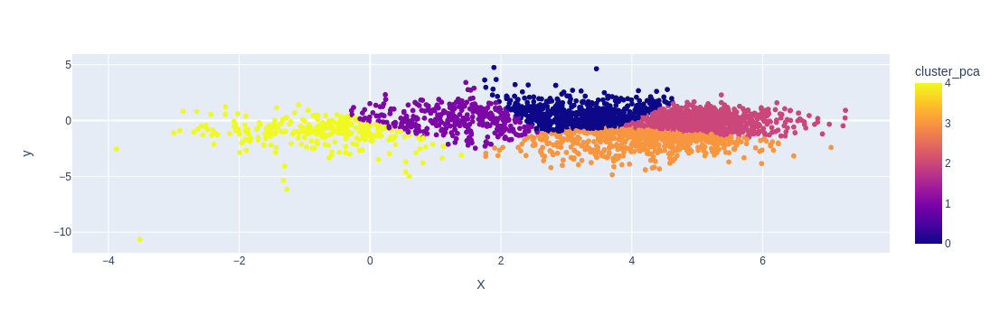

In [68]:
fig = px.scatter(features_Xy.toPandas(), x='X', y='y', color='cluster_pca', hover_data=['X', 'y', 'genres'])
fig.show();

##### Analyzing the graph, we verified that the result is not satisfactory. An explanation for this would be that our variables X and y are not adequately representing all the categorical variables in our data through PCA.

In [69]:
modelpipeline_genres.stages[2].explainedVariance

DenseVector([0.2975, 0.1212])

##### Checking the values above, it is understood that variable X is explaining approximately 3 categorical variables and our variable y is explaining only 1.
##### It is understood that our PCA was not satisfactory because in our database we have 14 variable categories and we had representation of only 4 of them if we add the values of X and y

### Creating the recommendation system from the initial database: database_music

In [70]:
database_music.limit(10).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,3,0.1060,-4.262,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness
6,0.722,2000,0.061600,Nelly,0.850,291782,0.700,1,3Gf5nttwcX9aaSQXRWidEZ,0.000002,7,0.2440,-6.490,1,Ride Wit Me,74,0.0478,101.875,Nelly - Ride Wit Me
7,0.507,2000,0.037100,Eminem,0.780,404107,0.768,1,3UmaczJpikHgJFyBTAJVoz,0.000002,6,0.5180,-4.325,0,Stan,78,0.2380,80.063,Eminem - Stan
8,0.861,2000,0.031000,*NSYNC,0.610,200400,0.926,0,62bOmKYxYg7dhrC6gH9vFn,0.001200,8,0.0821,-4.843,0,Bye Bye Bye,71,0.0479,172.638,*NSYNC - Bye Bye Bye
9,0.894,2000,0.300000,Britney Spears,0.751,211160,0.834,0,6naxalmIoLFWR0siv8dnQQ,0.000018,1,0.3550,-5.444,0,Oops!...I Did It Again,78,0.0437,95.053,Britney Spears - Oops!...I Did It Again


In [71]:
X_music =  database_music.columns
X_music.remove('artists')
X_music.remove('id')
X_music.remove('name')
X_music.remove('artists_song')

In [72]:
X_music

['valence',
 'year',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'explicit',
 'instrumentalness',
 'key',
 'liveness',
 'loudness',
 'mode',
 'popularity',
 'speechiness',
 'tempo']

In [73]:
music_df_vec = VectorAssembler(inputCols=X_music, outputCol='features').transform(database_music)

In [74]:
music_df_vec.limit(10).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song,features
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow,"[0.285, 2000.0, 0.00239, 0.429, 266773.0, 0.66..."
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson,"[0.613, 2000.0, 0.143, 0.843, 270507.0, 0.8059..."
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,3,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End,"[0.4, 2000.0, 0.00958, 0.556, 216880.0, 0.8640..."
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,11,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite,"[0.5429999999999999, 2000.0, 0.00664, 0.545, 2..."
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,5,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady,"[0.76, 2000.0, 0.0302, 0.949, 284200.0, 0.6609..."
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,3,0.1060,-4.262,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness,"[0.941, 2000.0, 0.000996, 0.695, 279213.0, 0.8..."
6,0.722,2000,0.061600,Nelly,0.850,291782,0.700,1,3Gf5nttwcX9aaSQXRWidEZ,0.000002,7,0.2440,-6.490,1,Ride Wit Me,74,0.0478,101.875,Nelly - Ride Wit Me,"[0.722, 2000.0, 0.0616, 0.85, 291782.0, 0.7, 1..."
7,0.507,2000,0.037100,Eminem,0.780,404107,0.768,1,3UmaczJpikHgJFyBTAJVoz,0.000002,6,0.5180,-4.325,0,Stan,78,0.2380,80.063,Eminem - Stan,"[0.507, 2000.0, 0.0371, 0.78, 404107.0, 0.768,..."
8,0.861,2000,0.031000,*NSYNC,0.610,200400,0.926,0,62bOmKYxYg7dhrC6gH9vFn,0.001200,8,0.0821,-4.843,0,Bye Bye Bye,71,0.0479,172.638,*NSYNC - Bye Bye Bye,"[0.861, 2000.0, 0.031, 0.61, 200400.0, 0.926, ..."
9,0.894,2000,0.300000,Britney Spears,0.751,211160,0.834,0,6naxalmIoLFWR0siv8dnQQ,0.000018,1,0.3550,-5.444,0,Oops!...I Did It Again,78,0.0437,95.053,Britney Spears - Oops!...I Did It Again,"[0.894, 2000.0, 0.3, 0.7509999999999999, 21116..."


In [75]:
music_df_vec\
    .select('features')\
    .show(n=10, truncate=False)

+-------------------------------------------------------------------------------------------------------------------------+
|features                                                                                                                 |
+-------------------------------------------------------------------------------------------------------------------------+
|[0.285,2000.0,0.00239,0.429,266773.0,0.6609999999999999,0.0,1.21E-4,11.0,0.234,-7.227,1.0,84.0,0.0281,173.372]           |
|[0.613,2000.0,0.143,0.843,270507.0,0.8059999999999999,1.0,0.0,4.0,0.0771,-5.9460000000000015,0.0,80.0,0.269,94.948]      |
|[0.4,2000.0,0.00958,0.556,216880.0,0.8640000000000001,0.0,0.0,3.0,0.209,-5.87,0.0,84.0,0.0584,105.143]                   |
|[0.5429999999999999,2000.0,0.00664,0.545,233933.0,0.865,0.0,1.1E-5,11.0,0.168,-5.7079999999999975,0.0,78.0,0.0286,99.009]|
|[0.76,2000.0,0.0302,0.949,284200.0,0.6609999999999999,1.0,0.0,5.0,0.0454,-4.244,0.0,80.0,0.0572,104.504]                 |
|[0.941,

### Normalizing the data

In [76]:
model_dfmusic_scaler = scaler.fit(music_df_vec)

In [77]:
database_music_scaled = model_dfmusic_scaler.transform(music_df_vec)

In [78]:
database_music_scaled.limit(10).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,...,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song,features,scaled_features
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,...,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow,"[0.285, 2000.0, 0.00239, 0.429, 266773.0, 0.66...","[1.156596679221045, 329.8170613984441, 0.00840..."
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,...,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson,"[0.613, 2000.0, 0.143, 0.843, 270507.0, 0.8059...","[2.4876974188157917, 329.8170613984441, 0.5027..."
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,...,0.2090,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End,"[0.4, 2000.0, 0.00958, 0.556, 216880.0, 0.8640...","[1.6232935848716423, 329.8170613984441, 0.0336..."
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,...,0.1680,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite,"[0.5429999999999999, 2000.0, 0.00664, 0.545, 2...","[2.203621041463254, 329.8170613984441, 0.02334..."
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,...,0.0454,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady,"[0.76, 2000.0, 0.0302, 0.949, 284200.0, 0.6609...","[3.0842578112561205, 329.8170613984441, 0.1061..."
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,...,0.1060,-4.262,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness,"[0.941, 2000.0, 0.000996, 0.695, 279213.0, 0.8...","[3.818798158410538, 329.8170613984441, 0.00350..."
6,0.722,2000,0.061600,Nelly,0.850,291782,0.700,1,3Gf5nttwcX9aaSQXRWidEZ,0.000002,...,0.2440,-6.490,1,Ride Wit Me,74,0.0478,101.875,Nelly - Ride Wit Me,"[0.722, 2000.0, 0.0616, 0.85, 291782.0, 0.7, 1...","[2.930044920693314, 329.8170613984441, 0.21658..."
7,0.507,2000,0.037100,Eminem,0.780,404107,0.768,1,3UmaczJpikHgJFyBTAJVoz,0.000002,...,0.5180,-4.325,0,Stan,78,0.2380,80.063,Eminem - Stan,"[0.507, 2000.0, 0.0371, 0.78, 404107.0, 0.768,...","[2.0575246188248064, 329.8170613984441, 0.1304..."
8,0.861,2000,0.031000,*NSYNC,0.610,200400,0.926,0,62bOmKYxYg7dhrC6gH9vFn,0.001200,...,0.0821,-4.843,0,Bye Bye Bye,71,0.0479,172.638,*NSYNC - Bye Bye Bye,"[0.861, 2000.0, 0.031, 0.61, 200400.0, 0.926, ...","[3.49413944143621, 329.8170613984441, 0.108995..."
9,0.894,2000,0.300000,Britney Spears,0.751,211160,0.834,0,6naxalmIoLFWR0siv8dnQQ,0.000018,...,0.3550,-5.444,0,Oops!...I Did It Again,78,0.0437,95.053,Britney Spears - Oops!...I Did It Again,"[0.894, 2000.0, 0.3, 0.7509999999999999, 21116...","[3.6280611621881205, 329.8170613984441, 1.0547..."


In [79]:
database_music_scaled\
    .select(
        'features',
        'scaled_features'
    )\
    .limit(10)\
    .toPandas()

,features,scaled_features
0,"[0.285, 2000.0, 0.00239, 0.429, 266773.0, 0.66...","[1.156596679221045, 329.8170613984441, 0.00840..."
1,"[0.613, 2000.0, 0.143, 0.843, 270507.0, 0.8059...","[2.4876974188157917, 329.8170613984441, 0.5027..."
2,"[0.4, 2000.0, 0.00958, 0.556, 216880.0, 0.8640...","[1.6232935848716423, 329.8170613984441, 0.0336..."
3,"[0.5429999999999999, 2000.0, 0.00664, 0.545, 2...","[2.203621041463254, 329.8170613984441, 0.02334..."
4,"[0.76, 2000.0, 0.0302, 0.949, 284200.0, 0.6609...","[3.0842578112561205, 329.8170613984441, 0.1061..."
5,"[0.941, 2000.0, 0.000996, 0.695, 279213.0, 0.8...","[3.818798158410538, 329.8170613984441, 0.00350..."
6,"[0.722, 2000.0, 0.0616, 0.85, 291782.0, 0.7, 1...","[2.930044920693314, 329.8170613984441, 0.21658..."
7,"[0.507, 2000.0, 0.0371, 0.78, 404107.0, 0.768,...","[2.0575246188248064, 329.8170613984441, 0.1304..."
8,"[0.861, 2000.0, 0.031, 0.61, 200400.0, 0.926, ...","[3.49413944143621, 329.8170613984441, 0.108995..."
9,"[0.894, 2000.0, 0.3, 0.7509999999999999, 21116...","[3.6280611621881205, 329.8170613984441, 1.0547..."


### Applying PCA

#### Defining value for k

In [80]:
k = len(X_music)
k

15

In [81]:
pca_music = PCA(inputCol='scaled_features', outputCol='pca_features', k=k)

In [82]:
modelpca_music = pca_music.fit(database_music_scaled)

In [83]:
database_music_pca = modelpca_music.transform(database_music_scaled)

In [84]:
database_music_pca.limit(10).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,...,loudness,mode,name,popularity,speechiness,tempo,artists_song,features,scaled_features,pca_features
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,...,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow,"[0.285, 2000.0, 0.00239, 0.429, 266773.0, 0.66...","[1.156596679221045, 329.8170613984441, 0.00840...","[-34.71004464775706, -165.3684878490618, -11.1..."
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,...,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson,"[0.613, 2000.0, 0.143, 0.843, 270507.0, 0.8059...","[2.4876974188157917, 329.8170613984441, 0.5027...","[-36.49885762774909, -167.85185045616552, -10...."
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,...,-5.870,0,In the End,84,0.0584,105.143,Linkin Park - In the End,"[0.4, 2000.0, 0.00958, 0.556, 216880.0, 0.8640...","[1.6232935848716423, 329.8170613984441, 0.0336...","[-35.46030091694059, -165.99633344577884, -11...."
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,...,-5.708,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite,"[0.5429999999999999, 2000.0, 0.00664, 0.545, 2...","[2.203621041463254, 329.8170613984441, 0.02334...","[-35.56301325520586, -165.59515096480604, -11...."
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,...,-4.244,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady,"[0.76, 2000.0, 0.0302, 0.949, 284200.0, 0.6609...","[3.0842578112561205, 329.8170613984441, 0.1061...","[-36.5455697490757, -167.3751250580248, -11.88..."
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,...,-4.262,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness,"[0.941, 2000.0, 0.000996, 0.695, 279213.0, 0.8...","[3.818798158410538, 329.8170613984441, 0.00350...","[-36.71322229026236, -166.48208483099705, -11...."
6,0.722,2000,0.061600,Nelly,0.850,291782,0.700,1,3Gf5nttwcX9aaSQXRWidEZ,0.000002,...,-6.490,1,Ride Wit Me,74,0.0478,101.875,Nelly - Ride Wit Me,"[0.722, 2000.0, 0.0616, 0.85, 291782.0, 0.7, 1...","[2.930044920693314, 329.8170613984441, 0.21658...","[-36.01324617882224, -166.63514920955342, -11...."
7,0.507,2000,0.037100,Eminem,0.780,404107,0.768,1,3UmaczJpikHgJFyBTAJVoz,0.000002,...,-4.325,0,Stan,78,0.2380,80.063,Eminem - Stan,"[0.507, 2000.0, 0.0371, 0.78, 404107.0, 0.768,...","[2.0575246188248064, 329.8170613984441, 0.1304...","[-36.542687712104936, -166.9792823483324, -8.7..."
8,0.861,2000,0.031000,*NSYNC,0.610,200400,0.926,0,62bOmKYxYg7dhrC6gH9vFn,0.001200,...,-4.843,0,Bye Bye Bye,71,0.0479,172.638,*NSYNC - Bye Bye Bye,"[0.861, 2000.0, 0.031, 0.61, 200400.0, 0.926, ...","[3.49413944143621, 329.8170613984441, 0.108995...","[-36.42524900978434, -165.10535006330755, -12...."
9,0.894,2000,0.300000,Britney Spears,0.751,211160,0.834,0,6naxalmIoLFWR0siv8dnQQ,0.000018,...,-5.444,0,Oops!...I Did It Again,78,0.0437,95.053,Britney Spears - Oops!...I Did It Again,"[0.894, 2000.0, 0.3, 0.7509999999999999, 21116...","[3.6280611621881205, 329.8170613984441, 1.0547...","[-35.87207491577076, -166.03098838247914, -12...."


In [85]:
database_music_pca\
    .select('pca_features')\
    .limit(10)\
    .toPandas()

,pca_features
0,"[-34.71004464775706, -165.3684878490618, -11.1..."
1,"[-36.49885762774909, -167.85185045616552, -10...."
2,"[-35.46030091694059, -165.99633344577884, -11...."
3,"[-35.56301325520586, -165.59515096480604, -11...."
4,"[-36.5455697490757, -167.3751250580248, -11.88..."
5,"[-36.71322229026236, -166.48208483099705, -11...."
6,"[-36.01324617882224, -166.63514920955342, -11...."
7,"[-36.542687712104936, -166.9792823483324, -8.7..."
8,"[-36.42524900978434, -165.10535006330755, -12...."
9,"[-35.87207491577076, -166.03098838247914, -12...."


#### Analyzing the graph, we verified that the result is not satisfactory. An explanation for this would be that our variables X and y are not adequately representing all the categorical variables in our data through PCA.

In [86]:
modelpca_music.explainedVariance

DenseVector([0.213, 0.133, 0.0939, 0.0869, 0.0733, 0.0665, 0.0616, 0.0563, 0.0505, 0.0462, 0.0339, 0.0284, 0.0264, 0.0202, 0.0099])

In [87]:
sum(modelpca_music.explainedVariance) * 100

100.00000000000004

In [88]:
list_vlr = [sum(modelpca_music.explainedVariance[0:i+1]) for i in range (k)]

In [89]:
list_vlr

[0.21297354127107346,
 0.3459774162295507,
 0.43989805678254457,
 0.5267820578269105,
 0.6001038103117929,
 0.666571951365239,
 0.7282174213581728,
 0.7845103843321024,
 0.8350002357002615,
 0.8812446547406771,
 0.9151737562703051,
 0.9435370133056041,
 0.9699018569070164,
 0.9900947792885583,
 1.0000000000000004]

In [90]:
k = sum(np.array(list_vlr) <= 0.90)

In [91]:
k

10

#### Testing new value of K

In [92]:
pca_music = PCA(inputCol='scaled_features', outputCol='pca_features', k=k)

In [93]:
modelpca_music = pca_music.fit(database_music_scaled)

In [94]:
database_music_pca = modelpca_music.transform(database_music_scaled)

In [95]:
database_music_pca\
    .select('pca_features')\
    .limit(10)\
    .toPandas()

,pca_features
0,"[-34.71004464775706, -165.3684878490618, -11.1..."
1,"[-36.49885762774909, -167.85185045616552, -10...."
2,"[-35.46030091694059, -165.99633344577884, -11...."
3,"[-35.56301325520586, -165.59515096480604, -11...."
4,"[-36.5455697490757, -167.3751250580248, -11.88..."
5,"[-36.71322229026236, -166.48208483099705, -11...."
6,"[-36.01324617882224, -166.63514920955342, -11...."
7,"[-36.542687712104936, -166.9792823483324, -8.7..."
8,"[-36.42524900978434, -165.10535006330755, -12...."
9,"[-35.87207491577076, -166.03098838247914, -12...."


#### Analyzing the graph, we verified that the result is not satisfactory. An explanation for this would be that our variables X and y are not adequately representing all the categorical variables in our data through PCA.

In [96]:
modelpca_music.explainedVariance

DenseVector([0.213, 0.133, 0.0939, 0.0869, 0.0733, 0.0665, 0.0616, 0.0563, 0.0505, 0.0462])

In [97]:
sum(modelpca_music.explainedVariance) * 100

88.12446547406772

##### The value of 88.12 and representativeness of the categorical data is a satisfactory value, so let's set up our clusters and our recommendation system from that point

### KMeans database_music

#### Creating Pipeline

In [98]:
pipeline_music = Pipeline(stages=[
    VectorAssembler(inputCols=X_music, outputCol='features'),
    StandardScaler(inputCol='features', outputCol='scaled_features'),
    PCA(inputCol='scaled_features', outputCol='pca_features', k=k),
    KMeans(featuresCol='pca_features', predictionCol='cluster_pca', k=100, seed=SEED)
])

In [99]:
modelkm_pipeline = pipeline_music.fit(database_music)

In [100]:
projection_KM = modelkm_pipeline.transform(database_music)

In [101]:
projection_KM.limit(10).toPandas()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,...,mode,name,popularity,speechiness,tempo,artists_song,features,scaled_features,pca_features,cluster_pca
0,0.285,2000,0.002390,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,...,1,Yellow,84,0.0281,173.372,Coldplay - Yellow,"[0.285, 2000.0, 0.00239, 0.429, 266773.0, 0.66...","[1.156596679221045, 329.8170613984441, 0.00840...","[-34.71004464775706, -165.3684878490618, -11.1...",25
1,0.613,2000,0.143000,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,...,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson,"[0.613, 2000.0, 0.143, 0.843, 270507.0, 0.8059...","[2.4876974188157917, 329.8170613984441, 0.5027...","[-36.49885762774909, -167.85185045616552, -10....",53
2,0.400,2000,0.009580,Linkin Park,0.556,216880,0.864,0,60a0Rd6pjrkxjPbaKzXjfq,0.000000,...,0,In the End,84,0.0584,105.143,Linkin Park - In the End,"[0.4, 2000.0, 0.00958, 0.556, 216880.0, 0.8640...","[1.6232935848716423, 329.8170613984441, 0.0336...","[-35.46030091694059, -165.99633344577884, -11....",89
3,0.543,2000,0.006640,3 Doors Down,0.545,233933,0.865,0,6ZOBP3NvffbU4SZcrnt1k6,0.000011,...,0,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite,"[0.5429999999999999, 2000.0, 0.00664, 0.545, 2...","[2.203621041463254, 329.8170613984441, 0.02334...","[-35.56301325520586, -165.59515096480604, -11....",89
4,0.760,2000,0.030200,Eminem,0.949,284200,0.661,1,3yfqSUWxFvZELEM4PmlwIR,0.000000,...,0,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady,"[0.76, 2000.0, 0.0302, 0.949, 284200.0, 0.6609...","[3.0842578112561205, 329.8170613984441, 0.1061...","[-36.5455697490757, -167.3751250580248, -11.88...",53
5,0.941,2000,0.000996,Disturbed,0.695,279213,0.876,1,40rvBMQizxkIqnjPdEWY1v,0.000007,...,0,Down with the Sickness,76,0.0553,89.954,Disturbed - Down with the Sickness,"[0.941, 2000.0, 0.000996, 0.695, 279213.0, 0.8...","[3.818798158410538, 329.8170613984441, 0.00350...","[-36.71322229026236, -166.48208483099705, -11....",14
6,0.722,2000,0.061600,Nelly,0.850,291782,0.700,1,3Gf5nttwcX9aaSQXRWidEZ,0.000002,...,1,Ride Wit Me,74,0.0478,101.875,Nelly - Ride Wit Me,"[0.722, 2000.0, 0.0616, 0.85, 291782.0, 0.7, 1...","[2.930044920693314, 329.8170613984441, 0.21658...","[-36.01324617882224, -166.63514920955342, -11....",0
7,0.507,2000,0.037100,Eminem,0.780,404107,0.768,1,3UmaczJpikHgJFyBTAJVoz,0.000002,...,0,Stan,78,0.2380,80.063,Eminem - Stan,"[0.507, 2000.0, 0.0371, 0.78, 404107.0, 0.768,...","[2.0575246188248064, 329.8170613984441, 0.1304...","[-36.542687712104936, -166.9792823483324, -8.7...",16
8,0.861,2000,0.031000,*NSYNC,0.610,200400,0.926,0,62bOmKYxYg7dhrC6gH9vFn,0.001200,...,0,Bye Bye Bye,71,0.0479,172.638,*NSYNC - Bye Bye Bye,"[0.861, 2000.0, 0.031, 0.61, 200400.0, 0.926, ...","[3.49413944143621, 329.8170613984441, 0.108995...","[-36.42524900978434, -165.10535006330755, -12....",98
9,0.894,2000,0.300000,Britney Spears,0.751,211160,0.834,0,6naxalmIoLFWR0siv8dnQQ,0.000018,...,0,Oops!...I Did It Again,78,0.0437,95.053,Britney Spears - Oops!...I Did It Again,"[0.894, 2000.0, 0.3, 0.7509999999999999, 21116...","[3.6280611621881205, 329.8170613984441, 1.0547...","[-35.87207491577076, -166.03098838247914, -12....",14


In [102]:
projection_KM\
    .select(
        'pca_features',
        'cluster_pca'
    )\
    .show(n=20)

+--------------------+-----------+
|        pca_features|cluster_pca|
+--------------------+-----------+
|[-34.710044647757...|         25|
|[-36.498857627749...|         53|
|[-35.460300916940...|         89|
|[-35.563013255205...|         89|
|[-36.545569749075...|         53|
|[-36.713222290262...|         14|
|[-36.013246178822...|          0|
|[-36.542687712104...|         16|
|[-36.425249009784...|         98|
|[-35.872074915770...|         14|
|[-31.639065936568...|         73|
|[-35.661446890546...|          9|
|[-35.574542234850...|         35|
|[-36.022399748656...|         36|
|[-34.336941950985...|         21|
|[-35.096906055142...|         87|
|[-35.202423054032...|         85|
|[-34.942948671026...|         87|
|[-36.617404517517...|         48|
|[-34.296973387410...|         51|
+--------------------+-----------+
only showing top 20 rows



### Plotting The Clustering

In [103]:
projection_KM = projection_KM\
    .withColumn('X', vector_to_array('pca_features')[0])\
    .withColumn('y', vector_to_array('pca_features')[1])

In [104]:
projection_KM\
    .select(
        'X',
        'y',
        'pca_features',
        'cluster_pca'
    )\
    .show(n=10)

+-------------------+-------------------+--------------------+-----------+
|                  X|                  y|        pca_features|cluster_pca|
+-------------------+-------------------+--------------------+-----------+
| -34.71004464775706| -165.3684878490618|[-34.710044647757...|         25|
| -36.49885762774909|-167.85185045616552|[-36.498857627749...|         53|
| -35.46030091694059|-165.99633344577884|[-35.460300916940...|         89|
| -35.56301325520586|-165.59515096480604|[-35.563013255205...|         89|
|  -36.5455697490757| -167.3751250580248|[-36.545569749075...|         53|
| -36.71322229026236|-166.48208483099705|[-36.713222290262...|         14|
| -36.01324617882224|-166.63514920955342|[-36.013246178822...|          0|
|-36.542687712104936| -166.9792823483324|[-36.542687712104...|         16|
| -36.42524900978434|-165.10535006330755|[-36.425249009784...|         98|
| -35.87207491577076|-166.03098838247914|[-35.872074915770...|         14|
+-------------------+----

In [105]:
projection_KM_temp = projection_KM.toPandas()

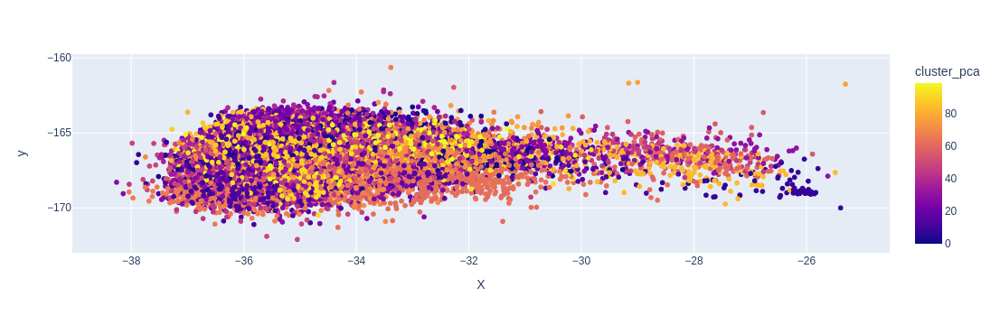

In [106]:
fig = px.scatter(projection_KM_temp,x='X', y='y', color='cluster_pca', hover_data=['artists_song'])
fig.show()

### Music Recomend

#### Calculating the distance between songs(Euclidean Distance)

##### In the next steps we will choose a song, and based on that song we will create some functions to calculate the distances from one song to another and thus group them together so we can generate some recommendations

In [107]:
music_name = 'Linkin Park - In the End'

In [108]:
cluster = projection_KM\
    .filter(projection_KM.artists_song == music_name)

In [109]:
cluster

DataFrame[valence: double, year: int, acousticness: double, artists: string, danceability: double, duration_ms: int, energy: double, explicit: int, id: string, instrumentalness: double, key: int, liveness: double, loudness: double, mode: int, name: string, popularity: int, speechiness: double, tempo: double, artists_song: string, features: vector, scaled_features: vector, pca_features: vector, cluster_pca: int, X: double, y: double]

In [110]:
cluster = cluster\
    .select('cluster_pca')\
    .collect()[0][0]

In [111]:
cluster

89

In [112]:
recomend_music = projection_KM\
    .filter(projection_KM.cluster_pca == cluster)\
    .select(
        'artists_song',
        'id',
        'pca_features'
    )

In [113]:
recomend_music.show(n=10)

+--------------------+--------------------+--------------------+
|        artists_song|                  id|        pca_features|
+--------------------+--------------------+--------------------+
|Linkin Park - In ...|60a0Rd6pjrkxjPbaK...|[-35.460300916940...|
|3 Doors Down - Kr...|6ZOBP3NvffbU4SZcr...|[-35.563013255205...|
|System Of A Down ...|2DlHlPMa4M17kufBv...|[-35.655404791795...|
|Backstreet Boys -...|6e40mgJiCid5HRAGr...|[-35.072233391817...|
|3 Doors Down - He...|3NLrRZoMF0Lx6zTlY...|[-34.576390921363...|
|Audioslave - Like...|3YuaBvuZqcwN3CEAy...|[-34.997748761321...|
|Evanescence - Bri...|0COqiPhxzoWICwFCS...|[-35.421997244419...|
|Three Days Grace ...|0M955bMOoilikPXwK...|[-35.274082367635...|
|     Muse - Hysteria|7xyYsOvq5Ec3P4fr6...|[-35.411711267128...|
|Muse - Time is Ru...|2takcwOaAZWiXQijP...|[-35.445319551544...|
+--------------------+--------------------+--------------------+
only showing top 10 rows



In [114]:
music_components = recomend_music\
    .filter(recomend_music.artists_song == music_name)\
    .select('pca_features')\
    .collect()[0][0]

In [115]:
music_components

DenseVector([-35.4603, -165.9963, -11.3613, -138.2428, 13.8667, -4.3427, -43.0147, -13.4632, 9.6031, -34.2515])

#### Function to calculate distance

In [116]:
def distance_calculation(value):
    return euclidean(music_components, value)

##### Converting function to pyspark

In [117]:
distance_calculation_udf = f.udf(distance_calculation, FloatType())

In [118]:
recomend_music_dist = recomend_music.withColumn('distance', distance_calculation_udf('pca_features'))

In [119]:
recomend_music_dist.show(n=10)

+--------------------+--------------------+--------------------+---------+
|        artists_song|                  id|        pca_features| distance|
+--------------------+--------------------+--------------------+---------+
|Linkin Park - In ...|60a0Rd6pjrkxjPbaK...|[-35.460300916940...|      0.0|
|3 Doors Down - Kr...|6ZOBP3NvffbU4SZcr...|[-35.563013255205...|2.3377137|
|System Of A Down ...|2DlHlPMa4M17kufBv...|[-35.655404791795...|1.8099374|
|Backstreet Boys -...|6e40mgJiCid5HRAGr...|[-35.072233391817...| 1.553582|
|3 Doors Down - He...|3NLrRZoMF0Lx6zTlY...|[-34.576390921363...|2.6138585|
|Audioslave - Like...|3YuaBvuZqcwN3CEAy...|[-34.997748761321...|1.9782243|
|Evanescence - Bri...|0COqiPhxzoWICwFCS...|[-35.421997244419...|1.4115539|
|Three Days Grace ...|0M955bMOoilikPXwK...|[-35.274082367635...|1.1568701|
|     Muse - Hysteria|7xyYsOvq5Ec3P4fr6...|[-35.411711267128...|1.9673405|
|Muse - Time is Ru...|2takcwOaAZWiXQijP...|[-35.445319551544...|1.9877369|
+--------------------+---

#### Ordering dataframe

In [120]:
recomend_music_dist\
    .sort('distance')\
    .show(n=20)

+--------------------+--------------------+--------------------+---------+
|        artists_song|                  id|        pca_features| distance|
+--------------------+--------------------+--------------------+---------+
|Linkin Park - In ...|60a0Rd6pjrkxjPbaK...|[-35.460300916940...|      0.0|
|Thousand Foot Kru...|6jg3Om6ZBMKlylfor...|[-35.715607945419...|1.0167173|
|Pop Evil - Be Leg...|3pOMQhSSzx6IZ96kM...|[-35.839552849541...|1.0334979|
|Little Mix - Litt...|5FiBzGgY8zYSdWN7h...|[-34.922717158974...|1.1181606|
|Fall Out Boy - Ju...|0l2p5mDOP3czJ2FpD...|[-35.844940331737...|1.1462668|
|Three Days Grace ...|0M955bMOoilikPXwK...|[-35.274082367635...|1.1568701|
|Adele - Water Und...|4vb4mFvYsr2h6enhj...|[-35.499567357824...|1.1766932|
|           BTS - Lie|2cn8rNlgnQOJoqWqX...|[-35.473398633374...|1.2702711|
|Three Days Grace ...|2UDumaw7osnyjH7RZ...|[-35.637725653241...|1.3010256|
|ODESZA - All We N...|5jnp8E61wcoF6qIEt...|[-35.369316002194...|1.3056239|
|Bastille - Of The...|7BN

In [121]:
recomend = spark.createDataFrame(
    recomend_music_dist\
        .sort('distance')\
        .take(10)
)\
    .select([
        'artists_song',
        'id',
        'distance'
    ])

In [122]:
recomend.show()

+--------------------+--------------------+------------------+
|        artists_song|                  id|          distance|
+--------------------+--------------------+------------------+
|Linkin Park - In ...|60a0Rd6pjrkxjPbaK...|               0.0|
|Thousand Foot Kru...|6jg3Om6ZBMKlylfor...|1.0167173147201538|
|Pop Evil - Be Leg...|3pOMQhSSzx6IZ96kM...| 1.033497929573059|
|Little Mix - Litt...|5FiBzGgY8zYSdWN7h...| 1.118160605430603|
|Fall Out Boy - Ju...|0l2p5mDOP3czJ2FpD...|1.1462668180465698|
|Three Days Grace ...|0M955bMOoilikPXwK...|1.1568701267242432|
|Adele - Water Und...|4vb4mFvYsr2h6enhj...|1.1766932010650635|
|           BTS - Lie|2cn8rNlgnQOJoqWqX...|1.2702710628509521|
|Three Days Grace ...|2UDumaw7osnyjH7RZ...| 1.301025629043579|
|ODESZA - All We N...|5jnp8E61wcoF6qIEt...|1.3056238889694214|
+--------------------+--------------------+------------------+



### Defining function for our recommender

In [123]:
def music_recommender(music_name):

    # Defining the cluster
    cluster = projection_KM\
        .filter(projection_KM.artists_song == music_name)\
        .select('cluster_pca')\
        .collect()[0][0]
    
    # Extracting components from music
    recomend_music = projection_KM\
        .filter(projection_KM.cluster_pca == cluster)\
        .select(
            'artists_song',
            'id',
            'pca_features'
        )
    music_components = recomend_music\
        .filter(recomend_music.artists_song == music_name)\
        .select('pca_features')\
        .collect()[0][0]

    #Calculate distance between songs
    recomend_music_dist = recomend_music\
        .withColumn('distance', distance_calculation_udf('pca_features'))

    # Selecting 10 songs based on the distance between them
    recomend = spark.createDataFrame(
        recomend_music_dist\
            .sort('distance')\
            .take(10)
    )\
        .select([
            'artists_song',
            'id',
            'distance'
        ])
    #Displaying the 10 recommended songs
    print(f'If you listened to {music_name} you will also like listening to these songs:')
    recomend\
        .select('artists_song')\
        .show(truncate=False)

In [124]:
music_recommender('Linkin Park - In the End')

If you listened to Linkin Park - In the End you will also like listening to these songs:
+----------------------------------------------+
|artists_song                                  |
+----------------------------------------------+
|Linkin Park - In the End                      |
|Thousand Foot Krutch - War of Change          |
|Pop Evil - Be Legendary                       |
|Little Mix - Little Me                        |
|Fall Out Boy - Just One Yesterday             |
|Three Days Grace - I Hate Everything About You|
|Adele - Water Under the Bridge                |
|BTS - Lie                                     |
|Three Days Grace - I Am Machine               |
|ODESZA - All We Need (feat. Shy Girls)        |
+----------------------------------------------+



### API Spotify

##### To use the Spotipy library in Python, or even just using the API with Python or another programming language, you must first access the Spotify for Developers website, in the Dashboard tab. There, you will find, near the footer, the option to Log In with your Spotify account or create a new account for free. Therefore, to use Spotify for Developers resources it is not necessary to be a premium Spotify user.

##### By clicking on Log In, a new tab opens and you can enter the credentials you use to access your Spotify. In this tab, you also have the option to create a new account.

##### Once your account is connected to the developer profile, a dashboard tab will appear and there will be no projects.

##### The first step is to go to the first icon on the left, which says “My New App”, that is, My new application. When we hover the mouse over it, the text changes and becomes “Create an App”, so we can create a new application and that's where we click.

##### As soon as we click, a tab with the title “Create an app” and two blank fields appear to be filled in: App name and App description, that is, name and description of the application we are creating, respectively. Just below, there is a term of acceptance that you agree with everything that the Spotify development team's term of service created.

##### In the application name and description, you are free to put something that represents your project and is descriptive enough so that you don't forget why you created it. So, for this project, I will use the name “Music Recommender” and in the description I will put “Creating a music recommender”. After filling in the fields and clicking accept the terms of service, we can actually create the application.

##### After the project is created, the screen we will obtain presents the information we entered previously: the name and description of the application; the status of the application, which is in development mode; and the Client ID key. This key interests us a lot in this part of the process, as it allows us to access the necessary information and remove others from the database using the API. The button labeled “Show Client Secret” shows the secret key that is created simultaneously when we create the application.

##### What interests us at this moment are the redirection URIs and that more than one can be placed in this part. We just need to click on “ADD” and the link will appear in the list and the field will be cleared to receive another valid link.

##### In this case we can use localhost:5000/callback and, to be safe, we can add one more localhost:8888/callback. After completing this entire process, the configuration within Spotify for Developers is complete and we can use the information obtained, such as keys and redirect URIs, in the initial configuration code of the Spotipy library in our code.

#### My credentials

* Client ID: bdafb1c81ddc403082ec229cfd12f70e
* Client secret: 4e44846351a84deab027a6879c473618

#### Loading API spotify

In [125]:
scope = "user-library-read playlist-modify-private"

OAuth = SpotifyOAuth(
        scope=scope,         
        redirect_uri='http://localhost:5000/callback',
        client_id = 'bdafb1c81ddc403082ec229cfd12f70e',
        client_secret = '4e44846351a84deab027a6879c473618')

In [126]:
client_credentials_manager = SpotifyClientCredentials(client_id = 'bdafb1c81ddc403082ec229cfd12f70e',
                                                      client_secret = '4e44846351a84deab027a6879c473618')

sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

#### Searched for id of the chosen song

In [127]:
id = projection_KM\
    .filter(projection_KM.artists_song == music_name)\
    .select('id')\
    .collect()[0][0]

In [128]:
id

'60a0Rd6pjrkxjPbaKzXjfq'

##### Searching for music in the API with the id

In [129]:
sp.track(id)

{'album': {'album_type': 'album',
  'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/6XyY86QOPPrYVGvF9ch6wz'},
    'href': 'https://api.spotify.com/v1/artists/6XyY86QOPPrYVGvF9ch6wz',
    'id': '6XyY86QOPPrYVGvF9ch6wz',
    'name': 'Linkin Park',
    'type': 'artist',
    'uri': 'spotify:artist:6XyY86QOPPrYVGvF9ch6wz'}],
  'available_markets': ['AR',
   'AU',
   'AT',
   'BE',
   'BO',
   'BR',
   'BG',
   'CL',
   'CO',
   'CR',
   'CY',
   'CZ',
   'DK',
   'DO',
   'DE',
   'EC',
   'EE',
   'SV',
   'FI',
   'FR',
   'GR',
   'GT',
   'HN',
   'HK',
   'HU',
   'IS',
   'IE',
   'IT',
   'LV',
   'LT',
   'LU',
   'MY',
   'MT',
   'MX',
   'NL',
   'NZ',
   'NI',
   'NO',
   'PA',
   'PY',
   'PE',
   'PH',
   'PL',
   'PT',
   'SG',
   'SK',
   'ES',
   'SE',
   'CH',
   'TW',
   'TR',
   'UY',
   'US',
   'GB',
   'AD',
   'LI',
   'MC',
   'ID',
   'JP',
   'TH',
   'VN',
   'RO',
   'IL',
   'ZA',
   'SA',
   'AE',
   'BH',
   'QA',
   'OM',
   'KW',


### Improving recommendation systems using the Spotify API

In [130]:
def music_recommender(music_name):

    # Defining the cluster
    cluster = projection_KM\
        .filter(projection_KM.artists_song == music_name)\
        .select('cluster_pca')\
        .collect()[0][0]
    
    # Extracting components from music
    recomend_music = projection_KM\
        .filter(projection_KM.cluster_pca == cluster)\
        .select(
            'artists_song',
            'id',
            'pca_features'
        )
    music_components = recomend_music\
        .filter(recomend_music.artists_song == music_name)\
        .select('pca_features')\
        .collect()[0][0]

    #Calculate distance between songs
    recomend_music_dist = recomend_music\
        .withColumn('distance', distance_calculation_udf('pca_features'))

    # Selecting 10 songs based on the distance between them
    recomend = spark.createDataFrame(
        recomend_music_dist\
            .sort('distance')\
            .take(10)
    )\
        .select([
            'artists_song',
            'id',
            'distance'
        ])
    #Displaying the 10 recommended songs
    print(f'If you listened to {music_name} you will also like listening to these songs:')
    
    #Creating a list with the ids of the chosen songs
    playlist_id = recomend\
        .select('id')\
        .collect()

    #Extracting information and images from the API
    name = []
    url = []
    for id in playlist_id:
        track = sp.track(id[0])
        url.append(track['album']['images'][1]['url'])
        name.append(track['name'])
    
    #Creating list of images from recommendations
    plt.figure(figsize=(15,10))
    columns = 5
    for i, u in enumerate(url):
        ax = plt.subplot(len(url) // columns + 1, columns, i + 1)
        image = io.imread(u)
        plt.imshow(image)
        ax.get_yaxis().set_visible(False)
        plt.xticks(color='w', fontsize=0.1)
        plt.yticks(color='w', fontsize=0.1)
        plt.xlabel(name[i], fontsize=10)
        plt.tight_layout(h_pad=0.7, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.grid(visible=None)
    plt.show()

If you listened to Linkin Park - In the End you will also like listening to these songs:


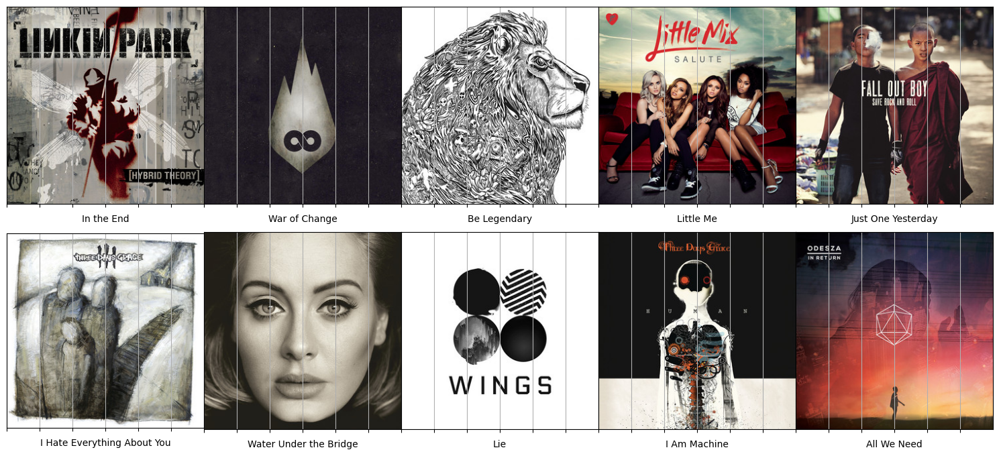

In [131]:
music_recommender('Linkin Park - In the End')

### Testing some more songs with our recommender

If you listened to Eminem - The Real Slim Shady you will also like listening to these songs:


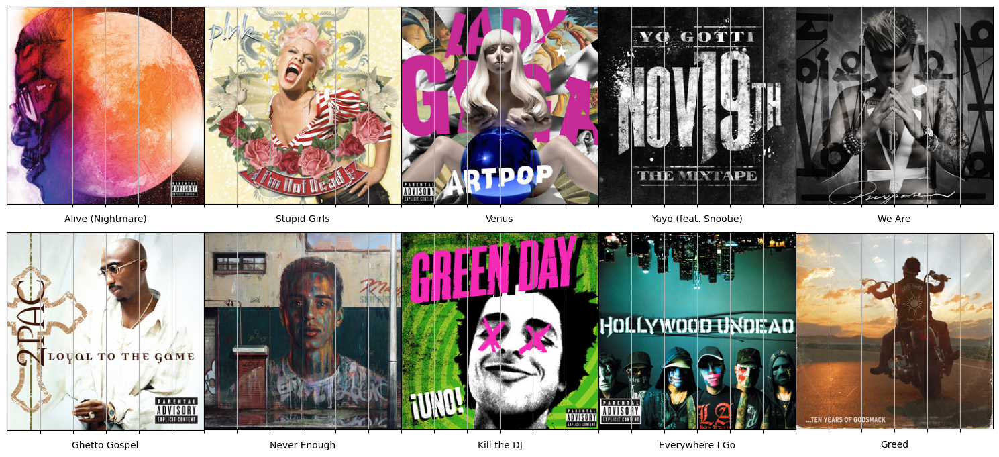

In [132]:
music_recommender('Eminem - The Real Slim Shady')

If you listened to Coldplay - Yellow you will also like listening to these songs:


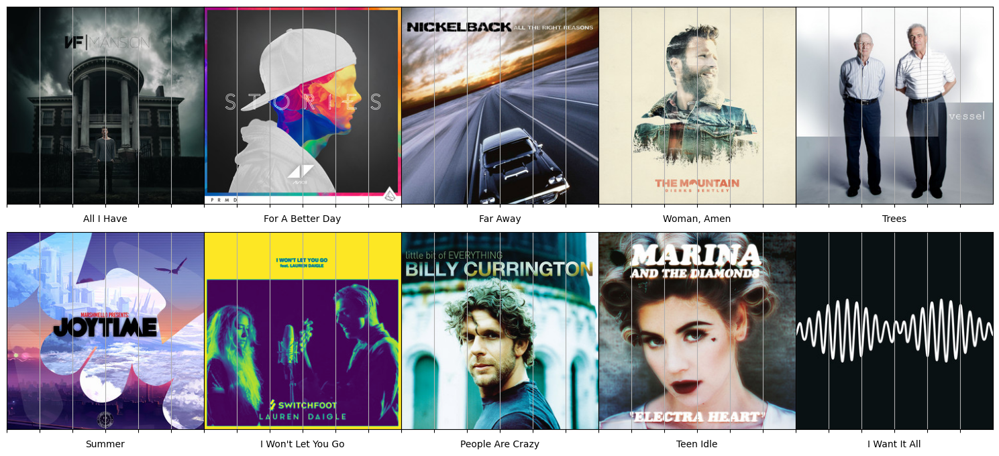

In [133]:
music_recommender('Coldplay - Yellow')

If you listened to Taylor Swift - Blank Space you will also like listening to these songs:


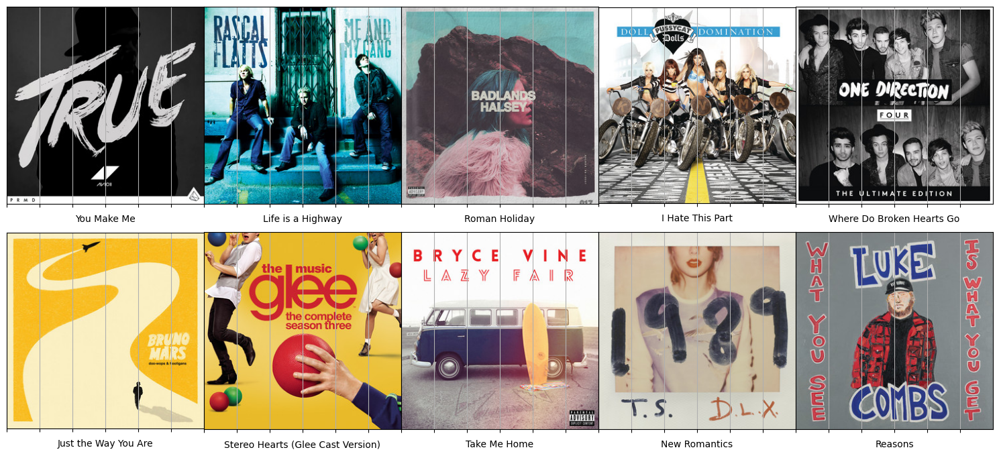

In [134]:
music_recommender('Taylor Swift - Blank Space')